In [ ]:
from pickleshare import print_function
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5 #clone repo
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output # to display images




In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")


In [ ]:
#set up enviroment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

Get dataset from Roboflow

In [ ]:
rf = Roboflow(api_key="s2gVmBan35t39Dd6cTWi")
project = rf.workspace("pariphat").project("halal1")
dataset = project.version(3).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Halal1-3 in yolov5pytorch:: 100%|██████████| 262/262 [00:00<00:00, 2026.93it/s]


Train The Yolo Model

In [ ]:
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

python3: can't open file 'train.py': [Errno 2] No such file or directory


Show Training Results

In [ ]:
#Start tensorboard
#Launch after you have started training
#logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Prediction

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Halal1-3/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-66-ge57275a Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/25 /content/datasets/Halal1-3/valid/images/-E0-B8-AA-E0-B8-B3-E0-B9-80-E0-B8-99-E0-B8-B2-E0-B8-82-E0-B8-AD-E0-B8-87_IMG_2685_jpg.rf.1e109f6cf10ecc717fc8faaaf2da1d2e.jpg: 416x416 1 yes, 8.2ms
image 2/25 /content/datasets/Halal1-3/valid/images/IMG_1518_jpg.rf.f097d96c34165def3e5cc569efc1bff6.jpg: 416x416 1 yes, 8.2ms
image 3/25 /conte

Display Inference Images

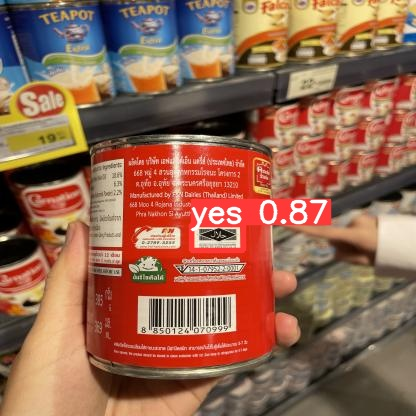

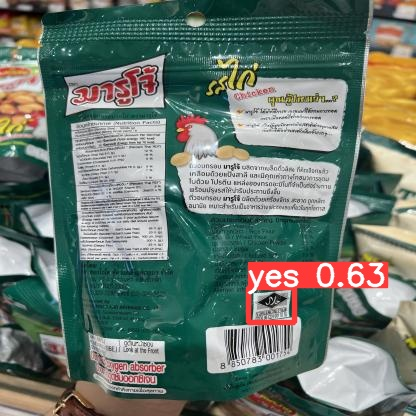

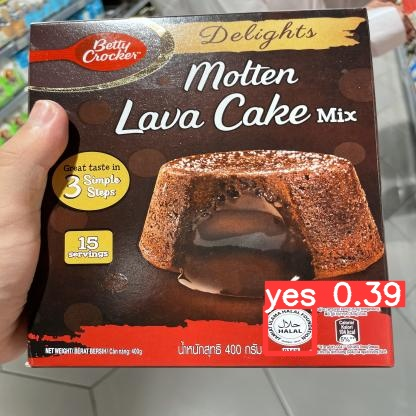

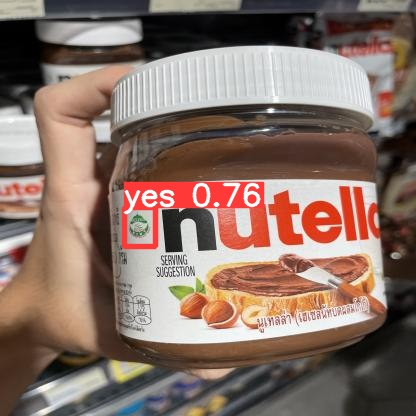

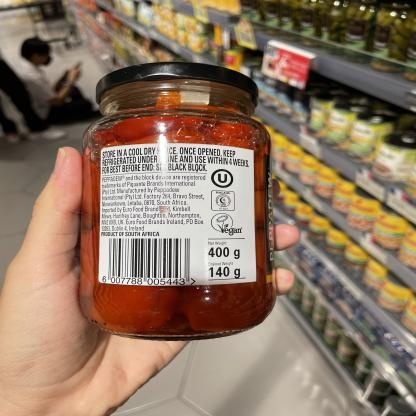

...

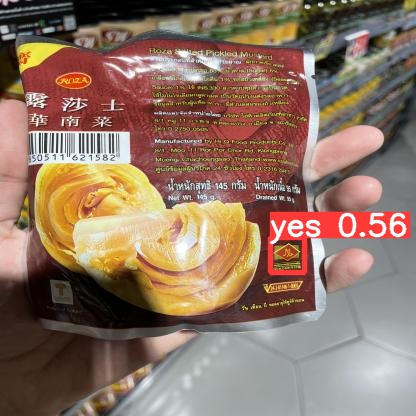

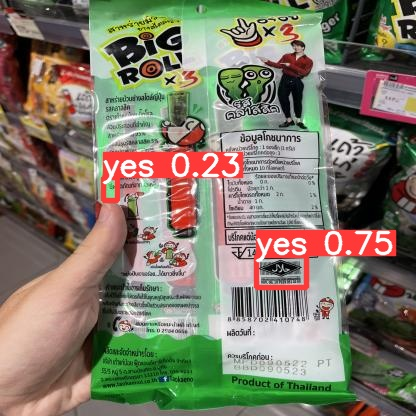

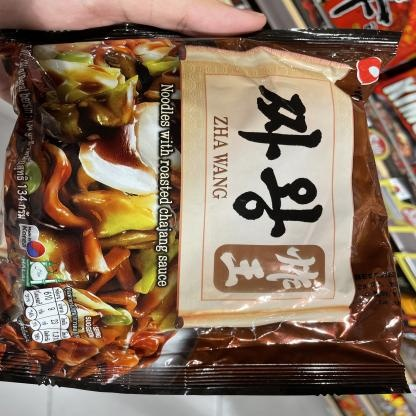

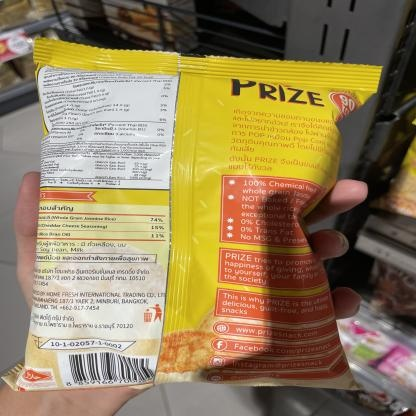

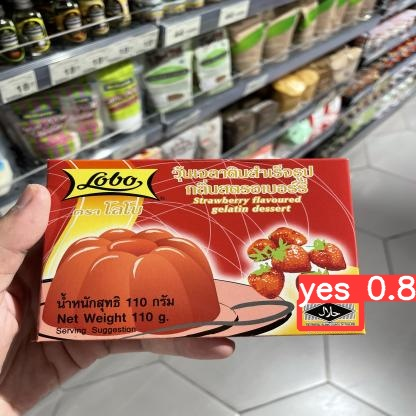

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display
i=0
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    i += 1

    if i < 30 :
      display(Image(filename=imageName))
      print("\n")



Save Model ลงเครื่อง

In [ ]:
# #export your model's weigths for future use
# from google.colab import files
# files.download('./runs/train/exp/weights/best.pt')